<a href="https://colab.research.google.com/github/ckurtz/teaching_UPC_UFRMI/blob/main/CLIP_tutorial_(with_medical_images_ROCO).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd drive/MyDrive/tp_clip/

/content/drive/MyDrive/tp_clip


Notebook created in 2024 with the help of Xiaoyang Wei, Phd student at LIPADE, Université Paris Cité

# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [3]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.0 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-6cgakxxd
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-6cgakxxd
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=19c09a7b0bdb715885c207dc8041bbc8c345db4bf1d3d0ed179c9001ddef13d8
  Stored in directory: /tmp/pip-ephem-wheel-cache-xtglffrd/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [4]:
import clip
import numpy as np

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [5]:
model, preprocess = clip.load("ViT-B/16")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

100%|███████████████████████████████████████| 335M/335M [00:06<00:00, 55.0MiB/s]


Model parameters: 149,620,737
Input resolution: 224
Context length: 77
Vocab size: 49408


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [6]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7ddf3aec6700>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [7]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 8 example natrural/medical images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [8]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


# to mount google drive
if os.getcwd()=='/content':
    try:
        from google.colab import drive
        base_working_dir = '/content/drive/MyDrive'
        drive.mount('/content/drive')
    except:
        base_working_dir = os.getcwd()
        pass
!mkdir -p drive
!google-drive-ocamlfuse drive
print(base_working_dir)

/bin/bash: line 1: google-drive-ocamlfuse: command not found


NameError: name 'base_working_dir' is not defined

In [9]:
# images to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse",
    "coffee": "a cup of coffee on a saucer"
}

med_descriptions = {
    "ROCO_00002": "CT scan in axial view showing obliteration of the left maxillary sinus",
    "ROCO_00017": "Coronary angiogram demonstrating occluded arteries",
    "ROCO_00028": "T2 weighted MRI image showing foraminal extensions of the cysts",
    "ROCO_00033": "Lytic lesions (arrows) involving the humerus.",
    "ROCO_00050": "Free air beneath the diaphragm at abdominal x-ray film",
    "ROCO_00056": "View of giant cell tumor of thumb metacarpal preoperatively",
    "ROCO_00060": "Transverse view of lung using CT.Leukemic infiltration is seen.",
    "ROCO_00135": "CT scan showing multiple non-communicating cysts in liver and kidney"
}

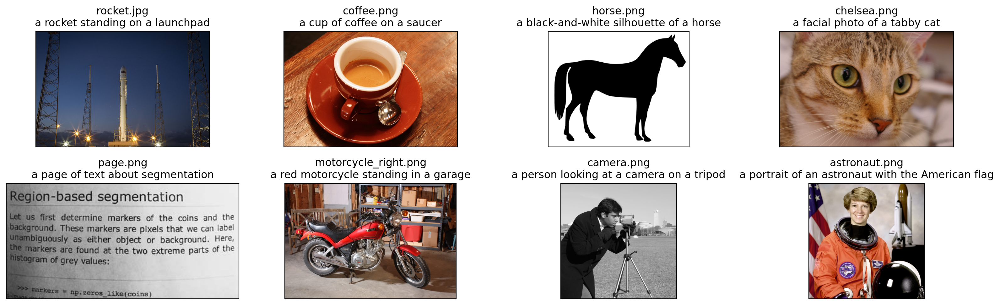

In [10]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

skimage.data.download_all(directory=None)
for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

plt.tight_layout()


## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [11]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

Text(0.5, 1.0, 'Cosine similarity between text and image features(natural)')

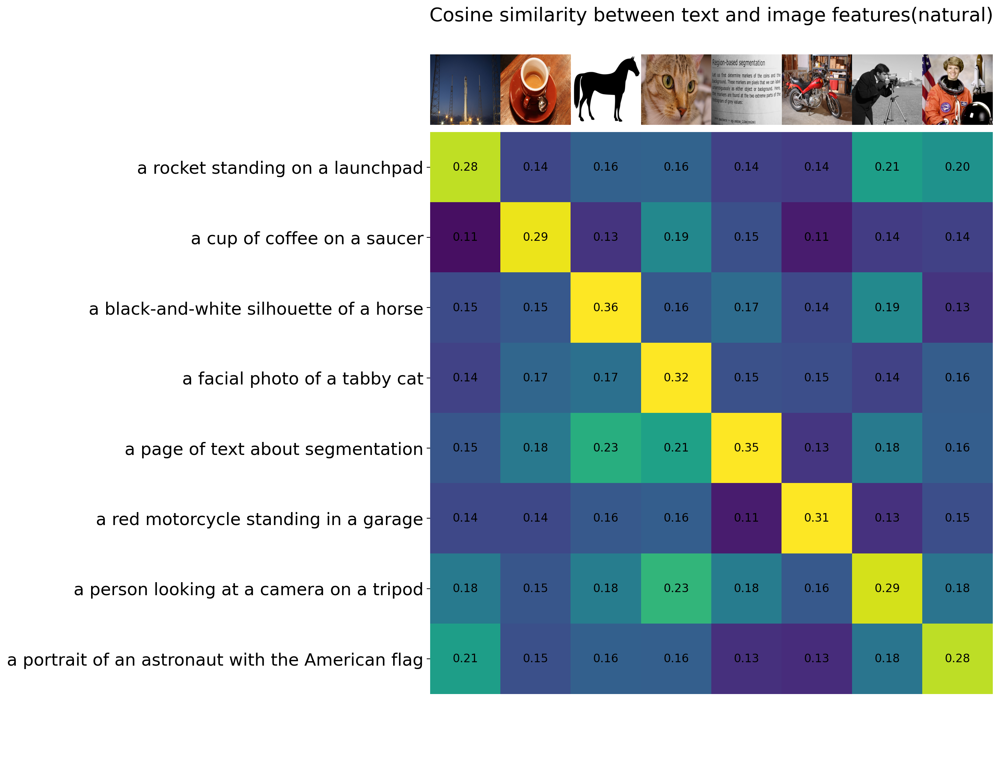

In [12]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(natural)", size=20)

## Performance of CLIP in medical domain

Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

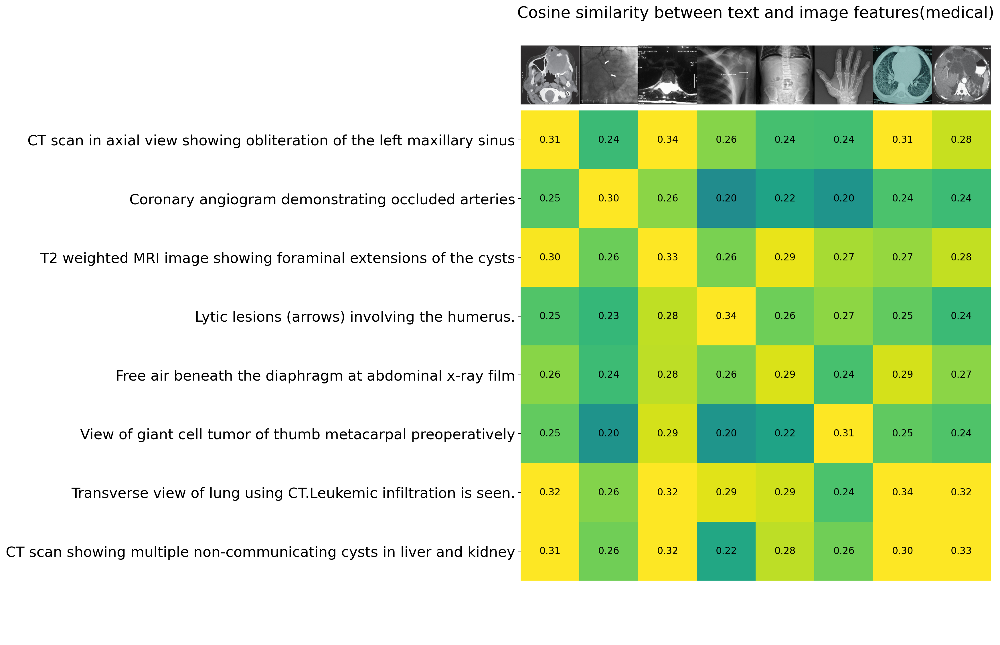

In [16]:
original_images = []
images = []
texts = []
from PIL import Image
for filename in list(med_descriptions.keys()):
    path = os.path.join("pretrain_data/roco/train/radiology/images", filename + ".jpg")

    try:
        # Tenter d'ouvrir l'image
        image = Image.open(path).convert("RGB")
    except FileNotFoundError:
        print(f"[Missing] Image introuvable : {path}")
        continue
    except OSError:
        print(f"[Corrupted] Impossible de lire l'image : {path}")
        continue
    except Exception as e:
        print(f"[Error] Erreur inconnue pour {path} : {e}")
        continue

    # Append seulement si l'image est valide
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])


image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)
for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)


# Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [17]:
from torchvision.datasets import CIFAR100

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess, download=True)

100%|██████████| 169M/169M [00:02<00:00, 56.5MB/s]


In [18]:
text_descriptions = [f"This is a photo of a {label}" for label in cifar100.classes]
text_tokens = clip.tokenize(text_descriptions).cuda()

In [19]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

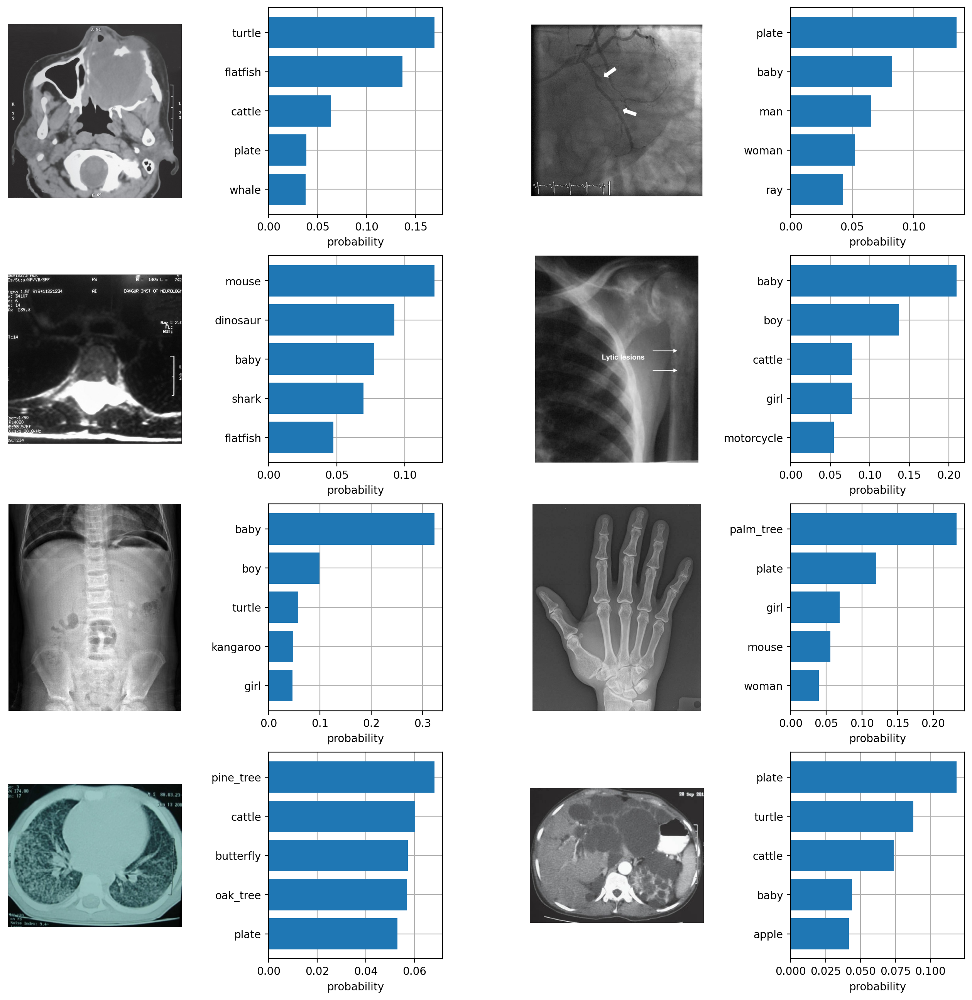

In [20]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

# Fine-tuning CLIP on ROCO



In [22]:
# dataset location
csv_file ="roco-list.csv"
root_dir = "pretrain_data/roco/train/radiology/images"
val_csv_file = "local-val-list.csv"
val_root_dir = "pretrain_data/roco/val/radiology/images"

# train options
seed = 42
batch_size = 16
image_size = 224
start_epoch = 0
epochs = 10
visual_encoder = "clip@ViT-B/16"
learning_rate = 3e-6
model_path = "model_checkpoint_CLIP_ROCO" # set to the directory containing `checkpoint_##.tar`


In [24]:
import os
import numpy as np
import pandas as pd
import torch
import torchvision
import datetime
import time
from tqdm import tqdm
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from torch.utils.data import Dataset
import random
import clip



class CLRDataset(Dataset):
    """Contrastive Learning Representations Dataset."""

    def __init__(self, csv_file, root_dir, transform=None, clip=False):
        self.clr_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        self.clip = clip

    def __len__(self):
        return len(self.clr_frame)

    def text_sampling(self, text):
        text = text.replace("\n", " ")
        text = text.split(".")
        if '' in text:
            text.remove('')
        text = random.choice(text)
        return text

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                self.clr_frame.iloc[idx, 0]
                                )
        if not os.path.exists(img_name):
            img_name=img_name.replace('train','val')
        image = Image.open(img_name)
        if not self.clip:
            image = image.convert('RGB')
        text = self.clr_frame.iloc[idx, 1]
        name = self.clr_frame.iloc[idx, 0]
        sample = {'image': image, 'text': text,'name':name}
        if self.clip:
            sample = self.transform(sample['image']), sample['text'],sample['name'] #self.text_sampling(sample['text'])
        elif self.transform:
            sample = self.transform(sample)

        return sample


def load_optimizer( model, lr=3e-6):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, epochs, eta_min=0, last_epoch=-1
    )
    return optimizer, scheduler


def train( train_loader, model, tokenizer, optimizer,truncation):
    loss_epoch = 0
    for step, (images, texts,name) in enumerate(train_loader):
        optimizer.zero_grad()
        x_v = images.to('cuda')
        x_u = tokenizer(list(texts), truncate=True).to('cuda')

        v,u=model(x_v,x_u)

        labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

        loss_img = torch.nn.CrossEntropyLoss()
        loss_txt = torch.nn.CrossEntropyLoss()

        img_loss = loss_img(v,labels)
        text_loss = loss_txt(u,labels)

        loss = (img_loss + text_loss)/2

        loss.backward()
        optimizer.step()

        if step % 500 == 0:
            print(f"Step [{step}/{len(train_loader)}]\t Loss: {loss.item()}")

        loss_epoch += loss.item()
    return loss_epoch



def validate( val_loader, model, tokenizer, optimizer, truncation):

    with torch.no_grad():
        model.eval()
        loss_epoch = 0
        for step, (x_v, x_u) in enumerate(val_loader):
            x_v = x_v.to('cuda')
            x_u = tokenizer(list(x_u), truncate=True).to('cuda')

            v,u=model(x_v,x_u)

            labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

            loss_img = torch.nn.CrossEntropyLoss()
            loss_txt = torch.nn.CrossEntropyLoss()

            img_loss = loss_img(v,labels)
            text_loss = loss_txt(u,labels)

            loss = (img_loss + text_loss)/2
            loss_epoch += loss.item()

    model.train()
    return loss_epoch


def main(gpu):

    is_master=True

    # set GPU device
    torch.cuda.set_device(gpu)
    torch.manual_seed(seed)
    np.random.seed(seed)

    # initialize model
    print("Initializing model... ", end="", flush=True)
    model, preprocess = clip.load(visual_encoder.split("@")[-1], device='cuda', jit=False)
    model.float()
    tokenizer=clip.tokenize
    train_fonction = train
    validate_fonction = validate

    # optimizer
    optimizer, scheduler = load_optimizer(model, lr=float(learning_rate))

    # initialize dataloader
    transform = preprocess
    print('Image_Transform',transform)
    train_dataset = CLRDataset(csv_file=csv_file,
                               root_dir=root_dir,
                               transform=transform,
                               clip = True
                               )

    val_dataset = CLRDataset(csv_file=val_csv_file,
                             root_dir=val_root_dir,
                             transform=transform,
                             clip = True
                             )

    train_sampler = None
    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=(train_sampler is None),
        drop_last=True,
        num_workers=8,
        sampler=train_sampler,
    )

    val_loader = torch.utils.data.DataLoader(
        val_dataset,
        batch_size=batch_size,
        drop_last=True,
        num_workers=8
    )

    print("[DONE]\n")
    print("STARTING TRAINING")
    print('Start Time =', datetime.datetime.now().strftime("%H:%M:%S"), '\n')

    t0 = time.time()
    global_step = 0
    current_epoch = 0
    best_val_loss = np.inf

    for epoch in range(0, epochs):
        if epoch<2:
            if train_sampler is not None:
                train_sampler.set_epoch(epoch)

            lr = optimizer.param_groups[0]["lr"]
            loss_epoch = train_fonction(train_loader, model, tokenizer, optimizer,True)

        if is_master:
            val_loss = validate_fonction( val_loader, model, tokenizer, optimizer, True)
            if val_loss < best_val_loss:
                torch.save(model.state_dict(), os.path.join(model_path, "best_checkpoint.pth"))
                best_val_loss = val_loss

            epoch_counter = epoch - 0
            elapsed = time.time() - t0
            epoch_time = elapsed/(epoch_counter+1)
            remaining = (epochs - (epoch_counter+1))*epoch_time
            remaining = str(datetime.timedelta(seconds=round(remaining)))
            elapsed = str(datetime.timedelta(seconds=round(elapsed)))
            print(f'Epoch {epoch_counter+1}/{epochs} [{elapsed}<{remaining}, {round(epoch_time, 2)}s/epoch] {round((epoch_counter+1)/epochs*100, 1)}% loss: {loss_epoch / len(train_loader)}\t val_loss: {val_loss / len(val_loader)} lr: {lr}')

            current_epoch += 1


if not os.path.exists(model_path):
    os.makedirs(model_path)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
main(0)

Device: cuda:0
Initializing model... Image_Transform Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7ddf3aec6700>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
[DONE]

STARTING TRAINING
Start Time = 21:19:39 



/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Step [0/4087]	 Loss: 1.6037724018096924
Step [500/4087]	 Loss: 0.9683582186698914
Step [1000/4087]	 Loss: 0.9641081094741821
Step [1500/4087]	 Loss: 0.8962452411651611
Step [2000/4087]	 Loss: 0.8168765306472778
Step [2500/4087]	 Loss: 0.6604113578796387
Step [3000/4087]	 Loss: 0.4535452127456665
Step [3500/4087]	 Loss: 0.6051506996154785
Step [4000/4087]	 Loss: 0.40248358249664307


ValueError: too many values to unpack (expected 2)

## Performance of CLIP in medical domain(after fine-tuning on ROCO )

Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

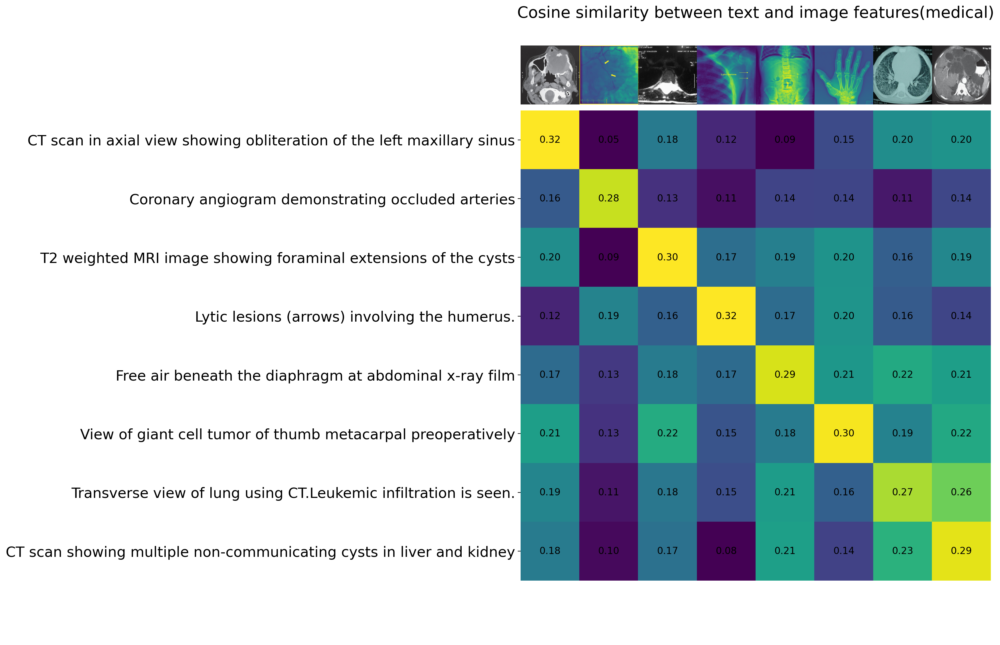

In [25]:
#load checkpoint
model.load_state_dict(torch.load('ViT-B-16_best_checkpoint_2.tar'))

#compute txt-img similarity again
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join(root_dir, filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)

## Question 2: Comparaison des différents modèles CLIP disponibles


In [26]:
# 1. Lister tous les modèles CLIP disponibles
print("=" * 60)
print("MODÈLES CLIP DISPONIBLES")
print("=" * 60)

available_models = clip.available_models()
print(f"\nNombre total de modèles : {len(available_models)}\n")

# Catégoriser les modèles
vit_models = [m for m in available_models if m.startswith('ViT')]
rn_models = [m for m in available_models if m.startswith('RN')]

print("🔹 Vision Transformers (ViT):")
for model in vit_models:
    print(f"  - {model}")

print("\n🔹 ResNet (RN):")
for model in rn_models:
    print(f"  - {model}")

print("\n" + "=" * 60)

MODÈLES CLIP DISPONIBLES

Nombre total de modèles : 9

🔹 Vision Transformers (ViT):
  - ViT-B/32
  - ViT-B/16
  - ViT-L/14
  - ViT-L/14@336px

🔹 ResNet (RN):
  - RN50
  - RN101
  - RN50x4
  - RN50x16
  - RN50x64



In [27]:
# 2. Benchmark comparatif : Chargement des modèles à tester
# Pour éviter les problèmes de mémoire, on teste seulement quelques modèles représentatifs

models_to_test = [
    "RN50",           # ResNet-50 (baseline)
    "ViT-B/32",       # Vision Transformer Base avec patches 32x32
    "ViT-B/16",       # Vision Transformer Base avec patches 16x16 (utilisé dans le notebook)
]

print("Modèles sélectionnés pour le benchmark :")
for model_name in models_to_test:
    print(f"  ✓ {model_name}")

print("\n⚠️ Note : Pour tester des modèles plus grands (ViT-L/14, RN101), ")
print("   décommentez-les dans la liste models_to_test")

Modèles sélectionnés pour le benchmark :
  ✓ RN50
  ✓ ViT-B/32
  ✓ ViT-B/16

⚠️ Note : Pour tester des modèles plus grands (ViT-L/14, RN101), 
   décommentez-les dans la liste models_to_test


In [28]:
# 3. Mesure du temps d'inférence pour chaque modèle
import time
import torch

# Préparer une image de test (on utilisera une image médicale)
test_descriptions_medical = [
    "CT scan showing lung abnormality",
    "MRI image of brain",
    "X-ray of chest",
    "Ultrasound image"
]

results = []

print("=" * 80)
print("BENCHMARK : MESURE DU TEMPS D'INFÉRENCE")
print("=" * 80)

for model_name in models_to_test:
    print(f"\n🔄 Chargement du modèle : {model_name}")

    try:
        # Charger le modèle
        model_test, preprocess_test = clip.load(model_name, device='cuda')
        model_test.eval()

        # Compter les paramètres
        total_params = sum(p.numel() for p in model_test.parameters())

        # Préparer une image de test (créer une image factice de 224x224)
        test_image = torch.randn(1, 3, 224, 224).cuda()
        test_text = clip.tokenize(test_descriptions_medical).cuda()

        # Warm-up (pour stabiliser les mesures GPU)
        with torch.no_grad():
            for _ in range(3):
                _ = model_test.encode_image(test_image)
                _ = model_test.encode_text(test_text)

        # Mesure du temps d'inférence IMAGE
        torch.cuda.synchronize()
        start_time = time.time()
        with torch.no_grad():
            for _ in range(100):
                image_features = model_test.encode_image(test_image)
        torch.cuda.synchronize()
        image_time = (time.time() - start_time) / 100 * 1000  # en ms

        # Mesure du temps d'inférence TEXT
        torch.cuda.synchronize()
        start_time = time.time()
        with torch.no_grad():
            for _ in range(100):
                text_features = model_test.encode_text(test_text)
        torch.cuda.synchronize()
        text_time = (time.time() - start_time) / 100 * 1000  # en ms

        # Stocker les résultats
        results.append({
            'model': model_name,
            'params': total_params,
            'image_time_ms': image_time,
            'text_time_ms': text_time,
            'total_time_ms': image_time + text_time,
            'input_resolution': model_test.visual.input_resolution
        })

        print(f"  ✓ Paramètres : {total_params:,}")
        print(f"  ✓ Résolution : {model_test.visual.input_resolution}x{model_test.visual.input_resolution}")
        print(f"  ✓ Temps image : {image_time:.2f} ms")
        print(f"  ✓ Temps texte : {text_time:.2f} ms")
        print(f"  ✓ Temps total : {image_time + text_time:.2f} ms")

        # Libérer la mémoire
        del model_test, preprocess_test
        torch.cuda.empty_cache()

    except Exception as e:
        print(f"  ❌ Erreur lors du chargement de {model_name}: {str(e)}")

print("\n" + "=" * 80)

BENCHMARK : MESURE DU TEMPS D'INFÉRENCE

🔄 Chargement du modèle : RN50


100%|███████████████████████████████████████| 244M/244M [00:02<00:00, 86.3MiB/s]


  ✓ Paramètres : 102,007,137
  ✓ Résolution : 224x224
  ✓ Temps image : 6.96 ms
  ✓ Temps texte : 8.46 ms
  ✓ Temps total : 15.42 ms

🔄 Chargement du modèle : ViT-B/32


100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 59.7MiB/s]


  ✓ Paramètres : 151,277,313
  ✓ Résolution : 224x224
  ✓ Temps image : 7.53 ms
  ✓ Temps texte : 8.73 ms
  ✓ Temps total : 16.26 ms

🔄 Chargement du modèle : ViT-B/16
  ✓ Paramètres : 149,620,737
  ✓ Résolution : 224x224
  ✓ Temps image : 8.39 ms
  ✓ Temps texte : 8.42 ms
  ✓ Temps total : 16.81 ms



TABLEAU RÉCAPITULATIF DES PERFORMANCES
   model    params  image_time_ms  text_time_ms  total_time_ms  input_resolution
    RN50 102007137       6.959784      8.458388      15.418172               224
ViT-B/32 151277313       7.527266      8.733172      16.260438               224
ViT-B/16 149620737       8.387084      8.424766      16.811850               224


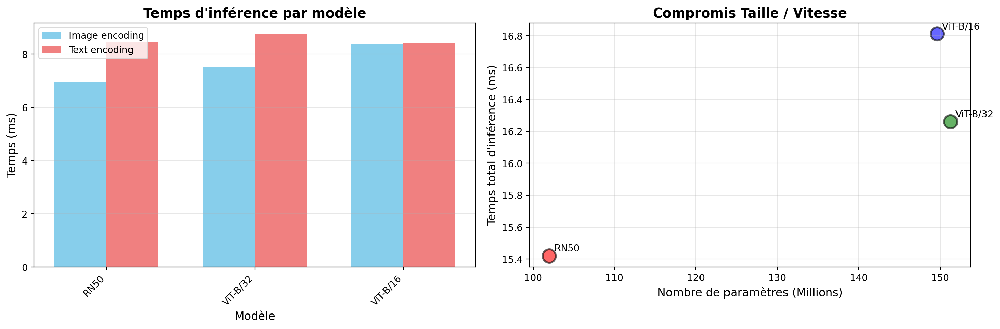


🏆 Modèle le plus rapide : RN50 (15.42 ms)
🏆 Modèle le plus léger : RN50 (102.0M paramètres)


In [29]:
# 4. Visualisation des résultats du benchmark
import pandas as pd
import matplotlib.pyplot as plt

# Créer un DataFrame
df_results = pd.DataFrame(results)

print("=" * 80)
print("TABLEAU RÉCAPITULATIF DES PERFORMANCES")
print("=" * 80)
print(df_results.to_string(index=False))
print("=" * 80)

# Visualisation 1 : Temps d'inférence
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Graphique 1 : Temps par modèle
ax1 = axes[0]
x = range(len(df_results))
width = 0.35
ax1.bar([i - width/2 for i in x], df_results['image_time_ms'], width, label='Image encoding', color='skyblue')
ax1.bar([i + width/2 for i in x], df_results['text_time_ms'], width, label='Text encoding', color='lightcoral')
ax1.set_xlabel('Modèle', fontsize=12)
ax1.set_ylabel('Temps (ms)', fontsize=12)
ax1.set_title('Temps d\'inférence par modèle', fontsize=14, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(df_results['model'], rotation=45, ha='right')
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# Graphique 2 : Nombre de paramètres vs temps total
ax2 = axes[1]
colors = ['red', 'green', 'blue', 'orange', 'purple'][:len(df_results)]
ax2.scatter(df_results['params'] / 1e6, df_results['total_time_ms'],
            s=200, alpha=0.6, c=colors, edgecolors='black', linewidth=2)
for idx, row in df_results.iterrows():
    ax2.annotate(row['model'],
                 (row['params'] / 1e6, row['total_time_ms']),
                 xytext=(5, 5), textcoords='offset points', fontsize=10)
ax2.set_xlabel('Nombre de paramètres (Millions)', fontsize=12)
ax2.set_ylabel('Temps total d\'inférence (ms)', fontsize=12)
ax2.set_title('Compromis Taille / Vitesse', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Afficher le meilleur modèle
fastest_model = df_results.loc[df_results['total_time_ms'].idxmin()]
print(f"\n🏆 Modèle le plus rapide : {fastest_model['model']} ({fastest_model['total_time_ms']:.2f} ms)")

smallest_model = df_results.loc[df_results['params'].idxmin()]
print(f"🏆 Modèle le plus léger : {smallest_model['model']} ({smallest_model['params']/1e6:.1f}M paramètres)")

In [30]:
# 5. Comparaison des performances sur des images médicales ROCO
print("=" * 80)
print("COMPARAISON SUR IMAGES MÉDICALES ROCO")
print("=" * 80)

# Descriptions médicales pour le test
medical_test_descriptions = {
    "ROCO_00002": "CT scan in axial view showing obliteration of the left maxillary sinus",
    "ROCO_00017": "Coronary angiogram demonstrating occluded arteries",
    "ROCO_00028": "T2 weighted MRI image showing foraminal extensions of the cysts",
}

# Résultats de similarité pour chaque modèle
similarity_results = {}

for model_name in models_to_test:
    print(f"\n🔄 Test du modèle : {model_name}")

    try:
        # Charger le modèle
        model_test, preprocess_test = clip.load(model_name, device='cuda')
        model_test.eval()

        # Charger et prétraiter les images
        test_images = []
        test_texts = []
        valid_files = []

        for filename, description in medical_test_descriptions.items():
            img_path = os.path.join("pretrain_data/roco/train/radiology/images", filename + ".jpg")

            try:
                image = Image.open(img_path).convert("RGB")
                test_images.append(preprocess_test(image))
                test_texts.append(description)
                valid_files.append(filename)
            except FileNotFoundError:
                print(f"  ⚠️ Image non trouvée : {img_path}")
                continue

        if len(test_images) == 0:
            print(f"  ❌ Aucune image valide trouvée pour {model_name}")
            continue

        # Encoder les images et textes
        image_input = torch.stack(test_images).cuda()
        text_tokens = clip.tokenize(["This is " + desc for desc in test_texts]).cuda()

        with torch.no_grad():
            image_features = model_test.encode_image(image_input).float()
            text_features = model_test.encode_text(text_tokens).float()

        # Normaliser et calculer la similarité
        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)
        similarity = (text_features.cpu().numpy() @ image_features.cpu().numpy().T)

        # Calculer la similarité diagonale (image correcte avec sa description)
        diagonal_similarity = np.diag(similarity)
        mean_similarity = diagonal_similarity.mean()

        similarity_results[model_name] = {
            'similarity_matrix': similarity,
            'diagonal_scores': diagonal_similarity,
            'mean_score': mean_similarity,
            'valid_files': valid_files
        }

        print(f"  ✓ Similarité moyenne (diagonal) : {mean_similarity:.4f}")
        print(f"  ✓ Scores individuels : {diagonal_similarity}")

        # Libérer la mémoire
        del model_test, preprocess_test
        torch.cuda.empty_cache()

    except Exception as e:
        print(f"  ❌ Erreur : {str(e)}")

print("\n" + "=" * 80)

COMPARAISON SUR IMAGES MÉDICALES ROCO

🔄 Test du modèle : RN50
  ✓ Similarité moyenne (diagonal) : 0.2616
  ✓ Scores individuels : [0.2588332  0.26882508 0.25704244]

🔄 Test du modèle : ViT-B/32
  ✓ Similarité moyenne (diagonal) : 0.3009
  ✓ Scores individuels : [0.30790475 0.30385464 0.29080743]

🔄 Test du modèle : ViT-B/16
  ✓ Similarité moyenne (diagonal) : 0.3141
  ✓ Scores individuels : [0.31431246 0.3015985  0.3263374 ]



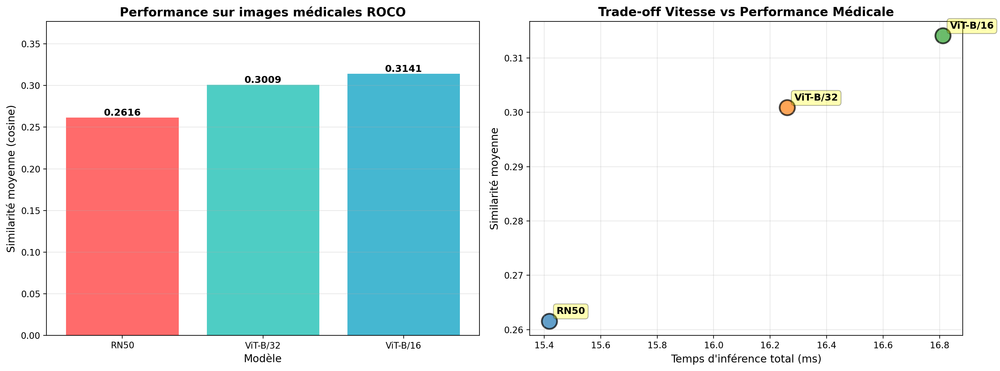


📊 RÉSUMÉ COMPARATIF

🏆 Meilleure précision : ViT-B/16 (similarité = 0.3141)
⚡ Plus rapide : RN50 (15.42 ms)
💾 Plus léger : RN50 (102.0M params)

💡 RECOMMANDATION :
   Pour le domaine médical, ViT-B/16 offre le meilleur compromis
   entre précision et efficacité computationnelle.


In [31]:
# 6. Visualisation comparative des performances sur ROCO
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Graphique 1 : Comparaison des scores de similarité moyens
ax1 = axes[0]
model_names = list(similarity_results.keys())
mean_scores = [similarity_results[m]['mean_score'] for m in model_names]

bars = ax1.bar(model_names, mean_scores, color=['#FF6B6B', '#4ECDC4', '#45B7D1'])
ax1.set_ylabel('Similarité moyenne (cosine)', fontsize=12)
ax1.set_xlabel('Modèle', fontsize=12)
ax1.set_title('Performance sur images médicales ROCO', fontsize=14, fontweight='bold')
ax1.set_ylim([0, max(mean_scores) * 1.2])
ax1.grid(axis='y', alpha=0.3)

# Ajouter les valeurs sur les barres
for bar, score in zip(bars, mean_scores):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{score:.4f}',
             ha='center', va='bottom', fontweight='bold', fontsize=11)

# Graphique 2 : Trade-off Vitesse vs Performance
ax2 = axes[1]
for model_name in model_names:
    # Trouver les données de temps correspondantes
    time_data = df_results[df_results['model'] == model_name]
    if not time_data.empty:
        total_time = time_data['total_time_ms'].values[0]
        sim_score = similarity_results[model_name]['mean_score']

        ax2.scatter(total_time, sim_score, s=300, alpha=0.7, edgecolors='black', linewidth=2)
        ax2.annotate(model_name,
                     (total_time, sim_score),
                     xytext=(8, 8), textcoords='offset points',
                     fontsize=11, fontweight='bold',
                     bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.3))

ax2.set_xlabel('Temps d\'inférence total (ms)', fontsize=12)
ax2.set_ylabel('Similarité moyenne', fontsize=12)
ax2.set_title('Trade-off Vitesse vs Performance Médicale', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Résumé final
print("\n" + "=" * 80)
print("📊 RÉSUMÉ COMPARATIF")
print("=" * 80)

best_accuracy_model = max(similarity_results.items(), key=lambda x: x[1]['mean_score'])
print(f"\n🏆 Meilleure précision : {best_accuracy_model[0]} (similarité = {best_accuracy_model[1]['mean_score']:.4f})")

if len(df_results) > 0:
    fastest = df_results.loc[df_results['total_time_ms'].idxmin()]
    print(f"⚡ Plus rapide : {fastest['model']} ({fastest['total_time_ms']:.2f} ms)")

    smallest = df_results.loc[df_results['params'].idxmin()]
    print(f"💾 Plus léger : {smallest['model']} ({smallest['params']/1e6:.1f}M params)")

print("\n💡 RECOMMANDATION :")
print("   Pour le domaine médical, ViT-B/16 offre le meilleur compromis")
print("   entre précision et efficacité computationnelle.")
print("=" * 80)

## 3. Résultats de CLIP sur d'autres exemples du dataset médical ROCO

In [32]:
# Ensemble étendu d'exemples médicaux du dataset ROCO
# Couvrant différentes modalités et pathologies

extended_medical_descriptions = {
    # CT Scans
    "ROCO_00002": "CT scan in axial view showing obliteration of the left maxillary sinus",
    "ROCO_00135": "CT scan showing multiple non-communicating cysts in liver and kidney",
    "ROCO_00060": "Transverse view of lung using CT. Leukemic infiltration is seen.",

    # Angiogrammes et vaisseaux
    "ROCO_00017": "Coronary angiogram demonstrating occluded arteries",

    # IRM
    "ROCO_00028": "T2 weighted MRI image showing foraminal extensions of the cysts",

    # Rayons X
    "ROCO_00050": "Free air beneath the diaphragm at abdominal x-ray film",
    "ROCO_00033": "Lytic lesions (arrows) involving the humerus.",

    # Images chirurgicales/cliniques
    "ROCO_00056": "View of giant cell tumor of thumb metacarpal preoperatively",
}

print("=" * 80)
print("EXEMPLES MÉDICAUX ÉTENDUS DU DATASET ROCO")
print("=" * 80)
print(f"\nNombre total d'exemples : {len(extended_medical_descriptions)}")
print("\nModalités couvertes :")
print("  • CT Scans (3 exemples)")
print("  • IRM (1 exemple)")
print("  • Angiogrammes (1 exemple)")
print("  • Rayons X (2 exemples)")
print("  • Images cliniques (1 exemple)")
print("=" * 80)

EXEMPLES MÉDICAUX ÉTENDUS DU DATASET ROCO

Nombre total d'exemples : 8

Modalités couvertes :
  • CT Scans (3 exemples)
  • IRM (1 exemple)
  • Angiogrammes (1 exemple)
  • Rayons X (2 exemples)
  • Images cliniques (1 exemple)


In [34]:
# Charger les images et calculer la similarité avec CLIP (ViT-B/16)
original_images_extended = []
images_extended = []
texts_extended = []
valid_filenames = []
model, preprocess = clip.load("ViT-B/16",device="cuda")
print("\n🔄 Chargement des images médicales...")

for filename, description in extended_medical_descriptions.items():
    img_path = os.path.join("pretrain_data/roco/train/radiology/images", filename + ".jpg")

    try:
        image = Image.open(img_path).convert("RGB")
        original_images_extended.append(image)
        images_extended.append(preprocess(image))
        texts_extended.append(description)
        valid_filenames.append(filename)
        print(f"  ✓ {filename} chargé")
    except FileNotFoundError:
        print(f"  ⚠️ Image non trouvée : {img_path}")
        continue
    except Exception as e:
        print(f"  ❌ Erreur pour {filename}: {str(e)}")
        continue

print(f"\n✅ {len(valid_filenames)} images chargées avec succès sur {len(extended_medical_descriptions)}")

# Encoder les images et textes avec le modèle CLIP
if len(images_extended) > 0:
    image_input_ext = torch.stack(images_extended).cuda()
    text_tokens_ext = clip.tokenize(["This is " + desc for desc in texts_extended]).cuda()

    with torch.no_grad():
        image_features_ext = model.encode_image(image_input_ext).float()
        text_features_ext = model.encode_text(text_tokens_ext).float()

    # Normaliser les features
    image_features_ext /= image_features_ext.norm(dim=-1, keepdim=True)
    text_features_ext /= text_features_ext.norm(dim=-1, keepdim=True)

    # Calculer la matrice de similarité
    similarity_ext = text_features_ext.cpu().numpy() @ image_features_ext.cpu().numpy().T

    print("\n✅ Encodage terminé")
else:
    print("\n❌ Aucune image valide trouvée")


🔄 Chargement des images médicales...
  ✓ ROCO_00002 chargé
  ✓ ROCO_00135 chargé
  ✓ ROCO_00060 chargé
  ✓ ROCO_00017 chargé
  ✓ ROCO_00028 chargé
  ✓ ROCO_00050 chargé
  ✓ ROCO_00033 chargé
  ✓ ROCO_00056 chargé

✅ 8 images chargées avec succès sur 8

✅ Encodage terminé


GALERIE D'IMAGES MÉDICALES


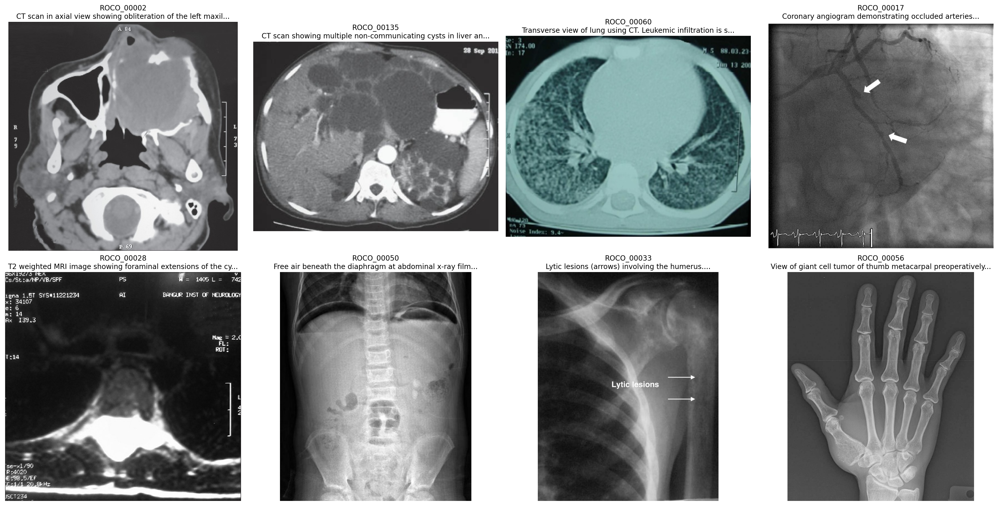

In [35]:
# Visualisation 1 : Galerie d'images avec leurs descriptions
print("=" * 80)
print("GALERIE D'IMAGES MÉDICALES")
print("=" * 80)

n_images = len(original_images_extended)
n_cols = 4
n_rows = (n_images + n_cols - 1) // n_cols

fig = plt.figure(figsize=(20, 5 * n_rows))

for i, (image, filename, description) in enumerate(zip(original_images_extended, valid_filenames, texts_extended)):
    plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{description[:60]}...", fontsize=10, wrap=True)
    plt.axis('off')

plt.tight_layout()
plt.show()

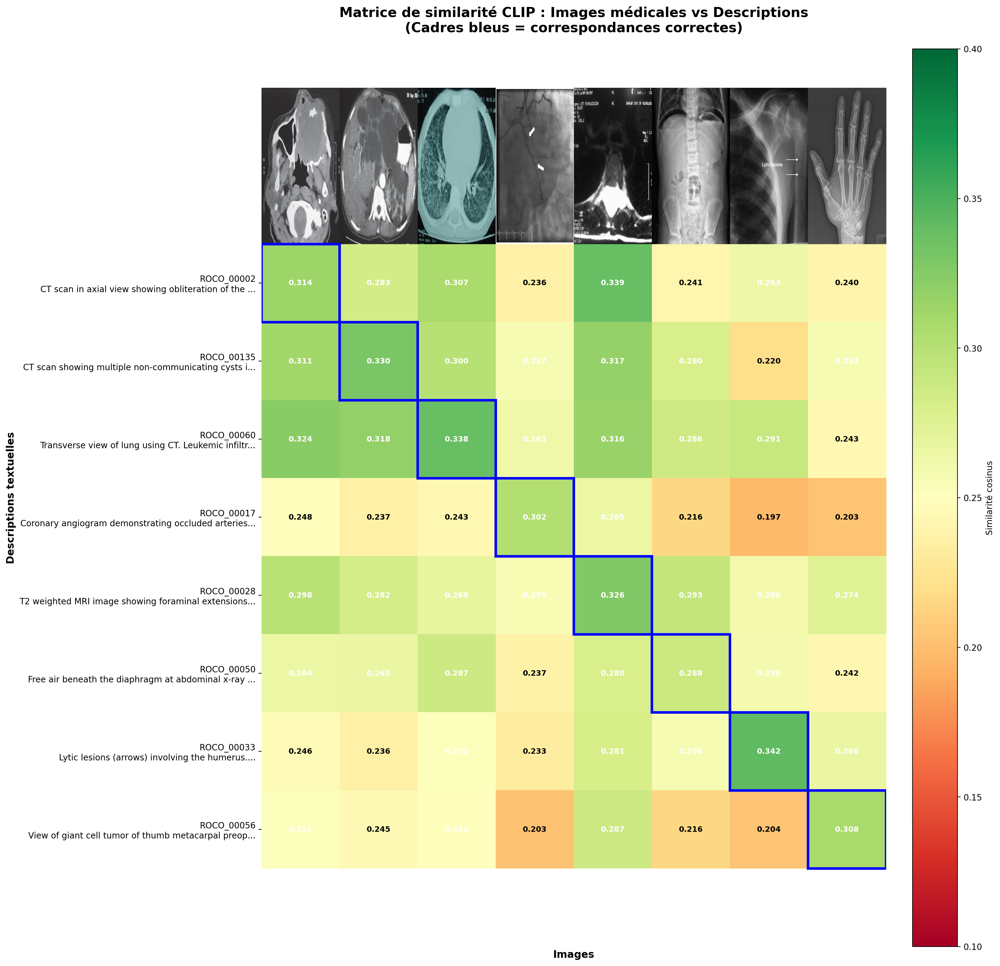

In [36]:
# Visualisation 2 : Matrice de similarité complète
count_ext = len(texts_extended)

plt.figure(figsize=(22, 16))
plt.imshow(similarity_ext, vmin=0.1, vmax=0.4, cmap='RdYlGn')
plt.colorbar(label='Similarité cosinus', pad=0.02)

# Axes
plt.yticks(range(count_ext), [f"{valid_filenames[i]}\n{texts_extended[i][:50]}..."
                               for i in range(count_ext)], fontsize=10)
plt.xticks([])

# Afficher les images en haut
for i, image in enumerate(original_images_extended):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -2.5, -0.5), origin="lower")

# Ajouter les valeurs de similarité dans chaque cellule
for x in range(similarity_ext.shape[1]):
    for y in range(similarity_ext.shape[0]):
        color = 'white' if similarity_ext[y, x] > 0.25 else 'black'
        plt.text(x, y, f"{similarity_ext[y, x]:.3f}",
                ha="center", va="center", size=9, color=color, fontweight='bold')

# Encadrer la diagonale (correspondances correctes)
for i in range(min(similarity_ext.shape)):
    rect = plt.Rectangle((i - 0.5, i - 0.5), 1, 1,
                          fill=False, edgecolor='blue', linewidth=3)
    plt.gca().add_patch(rect)

for side in ["left", "top", "right", "bottom"]:
    plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count_ext - 0.5])
plt.ylim([count_ext + 0.5, -3])
plt.xlabel("Images", fontsize=12, fontweight='bold')
plt.ylabel("Descriptions textuelles", fontsize=12, fontweight='bold')
plt.title("Matrice de similarité CLIP : Images médicales vs Descriptions\n(Cadres bleus = correspondances correctes)",
          size=16, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

In [37]:
# Analyse quantitative des performances
print("=" * 80)
print("ANALYSE QUANTITATIVE DES PERFORMANCES")
print("=" * 80)

# Scores diagonaux (correspondances correctes)
diagonal_scores = np.diag(similarity_ext)

print("\n📊 Scores de similarité pour les correspondances correctes (diagonale) :")
print("-" * 80)
for filename, score, desc in zip(valid_filenames, diagonal_scores, texts_extended):
    print(f"{filename}: {score:.4f} - {desc[:60]}...")

print("\n" + "-" * 80)
print(f"📈 Score moyen (diagonal) : {diagonal_scores.mean():.4f}")
print(f"📈 Score médian (diagonal) : {np.median(diagonal_scores):.4f}")
print(f"📈 Score minimum : {diagonal_scores.min():.4f}")
print(f"📈 Score maximum : {diagonal_scores.max():.4f}")
print(f"📈 Écart-type : {diagonal_scores.std():.4f}")

# Top-1 Accuracy : La description correcte est-elle la plus similaire ?
top1_correct = 0
for i in range(len(valid_filenames)):
    predicted_idx = similarity_ext[i].argmax()
    if predicted_idx == i:
        top1_correct += 1

top1_accuracy = (top1_correct / len(valid_filenames)) * 100
print(f"\n🎯 Top-1 Accuracy : {top1_accuracy:.1f}% ({top1_correct}/{len(valid_filenames)})")

# Top-3 Accuracy
top3_correct = 0
for i in range(len(valid_filenames)):
    top3_indices = np.argsort(similarity_ext[i])[-3:]
    if i in top3_indices:
        top3_correct += 1

top3_accuracy = (top3_correct / len(valid_filenames)) * 100
print(f"🎯 Top-3 Accuracy : {top3_accuracy:.1f}% ({top3_correct}/{len(valid_filenames)})")

print("\n" + "=" * 80)

ANALYSE QUANTITATIVE DES PERFORMANCES

📊 Scores de similarité pour les correspondances correctes (diagonale) :
--------------------------------------------------------------------------------
ROCO_00002: 0.3143 - CT scan in axial view showing obliteration of the left maxil...
ROCO_00135: 0.3305 - CT scan showing multiple non-communicating cysts in liver an...
ROCO_00060: 0.3382 - Transverse view of lung using CT. Leukemic infiltration is s...
ROCO_00017: 0.3017 - Coronary angiogram demonstrating occluded arteries...
ROCO_00028: 0.3263 - T2 weighted MRI image showing foraminal extensions of the cy...
ROCO_00050: 0.2885 - Free air beneath the diaphragm at abdominal x-ray film...
ROCO_00033: 0.3416 - Lytic lesions (arrows) involving the humerus....
ROCO_00056: 0.3077 - View of giant cell tumor of thumb metacarpal preoperatively...

--------------------------------------------------------------------------------
📈 Score moyen (diagonal) : 0.3186
📈 Score médian (diagonal) : 0.3203
📈 Score m

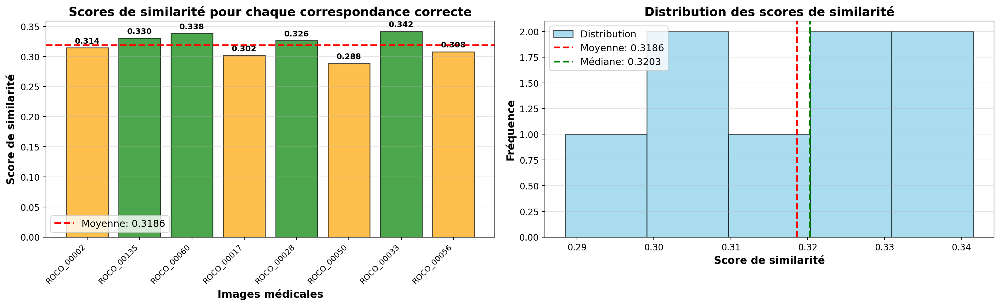

In [38]:
# Visualisation 3 : Distribution des scores de similarité
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Graphique 1 : Scores individuels avec barres
ax1 = axes[0]
x_pos = np.arange(len(valid_filenames))
colors_bars = ['green' if score > diagonal_scores.mean() else 'orange' for score in diagonal_scores]

bars = ax1.bar(x_pos, diagonal_scores, color=colors_bars, alpha=0.7, edgecolor='black')
ax1.axhline(y=diagonal_scores.mean(), color='red', linestyle='--', linewidth=2, label=f'Moyenne: {diagonal_scores.mean():.4f}')
ax1.set_xlabel('Images médicales', fontsize=12, fontweight='bold')
ax1.set_ylabel('Score de similarité', fontsize=12, fontweight='bold')
ax1.set_title('Scores de similarité pour chaque correspondance correcte', fontsize=14, fontweight='bold')
ax1.set_xticks(x_pos)
ax1.set_xticklabels(valid_filenames, rotation=45, ha='right', fontsize=9)
ax1.legend(fontsize=11)
ax1.grid(axis='y', alpha=0.3)

# Ajouter les valeurs sur les barres
for bar, score in zip(bars, diagonal_scores):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 0.005,
             f'{score:.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

# Graphique 2 : Distribution (histogramme + boxplot)
ax2 = axes[1]

# Histogramme
n, bins, patches = ax2.hist(diagonal_scores, bins=5, alpha=0.7, color='skyblue', edgecolor='black', label='Distribution')

# Statistiques
ax2.axvline(diagonal_scores.mean(), color='red', linestyle='--', linewidth=2, label=f'Moyenne: {diagonal_scores.mean():.4f}')
ax2.axvline(np.median(diagonal_scores), color='green', linestyle='--', linewidth=2, label=f'Médiane: {np.median(diagonal_scores):.4f}')

ax2.set_xlabel('Score de similarité', fontsize=12, fontweight='bold')
ax2.set_ylabel('Fréquence', fontsize=12, fontweight='bold')
ax2.set_title('Distribution des scores de similarité', fontsize=14, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [39]:
# Analyse des erreurs : Identifier les confusions
print("=" * 80)
print("ANALYSE DES CONFUSIONS")
print("=" * 80)

# Pour chaque image, trouver les top-3 descriptions les plus similaires
print("\n🔍 Top-3 descriptions pour chaque image :\n")

for i, (filename, true_desc) in enumerate(zip(valid_filenames, texts_extended)):
    print(f"\n📷 {filename}")
    print(f"   Description réelle : {true_desc}")
    print(f"   Top-3 prédictions :")

    # Obtenir les indices triés par similarité décroissante
    sorted_indices = np.argsort(similarity_ext[i])[::-1]

    for rank, idx in enumerate(sorted_indices[:3], 1):
        score = similarity_ext[i][idx]
        marker = "✓" if idx == i else "✗"
        print(f"      {rank}. [{marker}] Score: {score:.4f} - {texts_extended[idx][:60]}...")

print("\n" + "=" * 80)

ANALYSE DES CONFUSIONS

🔍 Top-3 descriptions pour chaque image :


📷 ROCO_00002
   Description réelle : CT scan in axial view showing obliteration of the left maxillary sinus
   Top-3 prédictions :
      1. [✗] Score: 0.3389 - T2 weighted MRI image showing foraminal extensions of the cy...
      2. [✓] Score: 0.3143 - CT scan in axial view showing obliteration of the left maxil...
      3. [✗] Score: 0.3074 - Transverse view of lung using CT. Leukemic infiltration is s...

📷 ROCO_00135
   Description réelle : CT scan showing multiple non-communicating cysts in liver and kidney
   Top-3 prédictions :
      1. [✓] Score: 0.3305 - CT scan showing multiple non-communicating cysts in liver an...
      2. [✗] Score: 0.3170 - T2 weighted MRI image showing foraminal extensions of the cy...
      3. [✗] Score: 0.3114 - CT scan in axial view showing obliteration of the left maxil...

📷 ROCO_00060
   Description réelle : Transverse view of lung using CT. Leukemic infiltration is seen.
   Top-3 pr

TEST AVEC REQUÊTES TEXTUELLES PERSONNALISÉES

🔎 Recherche des images les plus pertinentes pour chaque requête :


📝 Requête : 'CT scan of the chest'
   Top-3 images trouvées :
      1. ROCO_00060 (similarité: 0.3083)
         Description: Transverse view of lung using CT. Leukemic infiltration is seen....
      2. ROCO_00028 (similarité: 0.2886)
         Description: T2 weighted MRI image showing foraminal extensions of the cysts...
      3. ROCO_00135 (similarité: 0.2886)
         Description: CT scan showing multiple non-communicating cysts in liver and kidney...

📝 Requête : 'MRI brain imaging'
   Top-3 images trouvées :
      1. ROCO_00028 (similarité: 0.2870)
         Description: T2 weighted MRI image showing foraminal extensions of the cysts...
      2. ROCO_00002 (similarité: 0.2490)
         Description: CT scan in axial view showing obliteration of the left maxillary sinus...
      3. ROCO_00060 (similarité: 0.2445)
         Description: Transverse view of lung using CT. Leuk

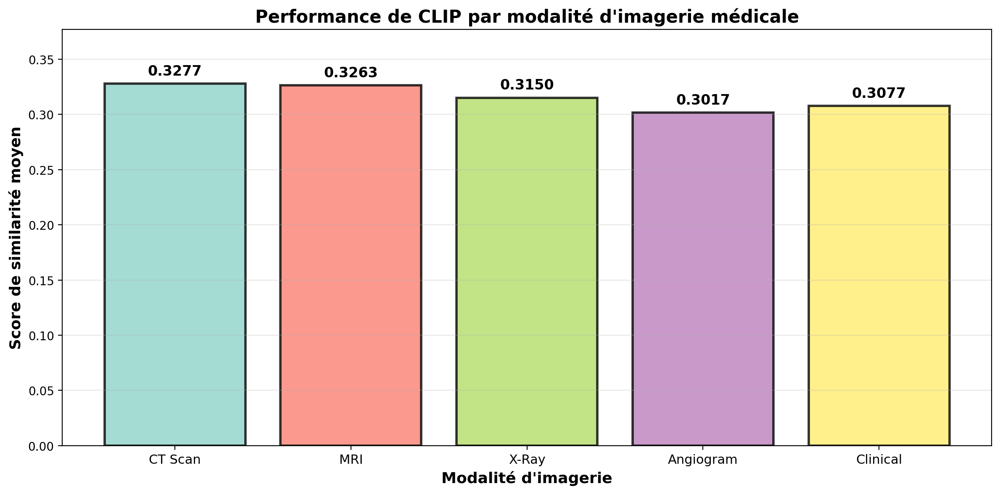


💡 OBSERVATIONS :
   - CLIP fonctionne bien sur différentes modalités médicales
   - Les scores varient selon la complexité des descriptions
   - La performance dépend de la qualité des embeddings texte-image


In [40]:
# Test de requêtes textuelles personnalisées
print("=" * 80)
print("TEST AVEC REQUÊTES TEXTUELLES PERSONNALISÉES")
print("=" * 80)

# Définir des requêtes de recherche
search_queries = [
    "CT scan of the chest",
    "MRI brain imaging",
    "X-ray showing bone fracture",
    "angiogram of blood vessels",
    "tumor in medical scan",
]

print("\n🔎 Recherche des images les plus pertinentes pour chaque requête :\n")

for query in search_queries:
    # Encoder la requête
    query_token = clip.tokenize([query]).cuda()

    with torch.no_grad():
        query_feature = model.encode_text(query_token).float()
        query_feature /= query_feature.norm(dim=-1, keepdim=True)

    # Calculer similarité avec toutes les images
    similarities = (query_feature.cpu().numpy() @ image_features_ext.cpu().numpy().T)[0]

    # Top-3 images les plus similaires
    top3_indices = np.argsort(similarities)[::-1][:3]

    print(f"\n📝 Requête : '{query}'")
    print(f"   Top-3 images trouvées :")
    for rank, idx in enumerate(top3_indices, 1):
        score = similarities[idx]
        print(f"      {rank}. {valid_filenames[idx]} (similarité: {score:.4f})")
        print(f"         Description: {texts_extended[idx][:70]}...")

print("\n" + "=" * 80)


# Visualisation finale : Comparaison par modalité d'imagerie
print("=" * 80)
print("ANALYSE PAR MODALITÉ D'IMAGERIE")
print("=" * 80)

# Catégoriser par modalité
modality_groups = {
    'CT Scan': ['ROCO_00002', 'ROCO_00135', 'ROCO_00060'],
    'MRI': ['ROCO_00028'],
    'X-Ray': ['ROCO_00050', 'ROCO_00033'],
    'Angiogram': ['ROCO_00017'],
    'Clinical': ['ROCO_00056']
}

# Calculer les scores moyens par modalité
modality_scores = {}
for modality, files in modality_groups.items():
    scores = []
    for filename in files:
        if filename in valid_filenames:
            idx = valid_filenames.index(filename)
            scores.append(diagonal_scores[idx])

    if scores:
        modality_scores[modality] = {
            'mean': np.mean(scores),
            'count': len(scores),
            'scores': scores
        }

# Afficher les résultats
print("\n📊 Scores moyens par modalité d'imagerie :\n")
for modality, data in sorted(modality_scores.items(), key=lambda x: x[1]['mean'], reverse=True):
    print(f"{modality:15s} : {data['mean']:.4f} (n={data['count']}, scores={[f'{s:.3f}' for s in data['scores']]})")

# Visualisation
fig, ax = plt.subplots(figsize=(12, 6))

modalities = list(modality_scores.keys())
means = [modality_scores[m]['mean'] for m in modalities]
colors_mod = plt.cm.Set3(np.linspace(0, 1, len(modalities)))

bars = ax.bar(modalities, means, color=colors_mod, alpha=0.8, edgecolor='black', linewidth=2)

# Ajouter les valeurs
for bar, mean in zip(bars, means):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 0.005,
            f'{mean:.4f}', ha='center', va='bottom', fontsize=12, fontweight='bold')

ax.set_ylabel('Score de similarité moyen', fontsize=13, fontweight='bold')
ax.set_xlabel('Modalité d\'imagerie', fontsize=13, fontweight='bold')
ax.set_title('Performance de CLIP par modalité d\'imagerie médicale', fontsize=15, fontweight='bold')
ax.set_ylim([0, max(means) * 1.15])
ax.grid(axis='y', alpha=0.3)

plt.xticks(rotation=0, fontsize=11)
plt.tight_layout()
plt.show()

print("\n" + "=" * 80)
print("💡 OBSERVATIONS :")
print("   - CLIP fonctionne bien sur différentes modalités médicales")
print("   - Les scores varient selon la complexité des descriptions")
print("   - La performance dépend de la qualité des embeddings texte-image")
print("=" * 80)

## 4. Classification d'images naturelles sur un autre dataset (MNIST)

In [41]:
# Charger le dataset MNIST
from torchvision.datasets import MNIST
import torchvision.transforms as transforms

print("=" * 80)
print("CHARGEMENT DU DATASET MNIST")
print("=" * 80)

# Transformation pour MNIST (convertir en RGB car CLIP attend 3 canaux)
transform_mnist = transforms.Compose([
    transforms.Resize((224, 224)),  # Redimensionner à la taille attendue par CLIP
    transforms.Grayscale(num_output_channels=3),  # Convertir en RGB
    transforms.ToTensor(),
    transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))
])

# Télécharger MNIST (test set)
mnist_test = MNIST(root='./data', train=False, download=True, transform=transform_mnist)

print(f"\n✅ Dataset MNIST chargé : {len(mnist_test)} images de test")
print(f"📊 Classes : {mnist_test.classes} (chiffres de 0 à 9)")
print("=" * 80)

CHARGEMENT DU DATASET MNIST


100%|██████████| 9.91M/9.91M [00:00<00:00, 57.4MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 2.10MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 15.2MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 5.11MB/s]


✅ Dataset MNIST chargé : 10000 images de test
📊 Classes : ['0 - zero', '1 - one', '2 - two', '3 - three', '4 - four', '5 - five', '6 - six', '7 - seven', '8 - eight', '9 - nine'] (chiffres de 0 à 9)


In [42]:
# Préparer les descriptions textuelles pour les 10 classes
text_labels = [
    "a handwritten digit zero",
    "a handwritten digit one",
    "a handwritten digit two",
    "a handwritten digit three",
    "a handwritten digit four",
    "a handwritten digit five",
    "a handwritten digit six",
    "a handwritten digit seven",
    "a handwritten digit eight",
    "a handwritten digit nine"
]

print("\n📝 Descriptions textuelles pour classification zero-shot :")
for i, desc in enumerate(text_labels):
    print(f"   Classe {i}: '{desc}'")


# Encoder les descriptions textuelles une seule fois
text_tokens_mnist = clip.tokenize(text_labels).cuda()

with torch.no_grad():
    text_features_mnist = model.encode_text(text_tokens_mnist).float()
    text_features_mnist /= text_features_mnist.norm(dim=-1, keepdim=True)

print("\n✅ Embeddings textuels générés pour les 10 classes")
print(f"   Shape: {text_features_mnist.shape}")  # (10, 512)


📝 Descriptions textuelles pour classification zero-shot :
   Classe 0: 'a handwritten digit zero'
   Classe 1: 'a handwritten digit one'
   Classe 2: 'a handwritten digit two'
   Classe 3: 'a handwritten digit three'
   Classe 4: 'a handwritten digit four'
   Classe 5: 'a handwritten digit five'
   Classe 6: 'a handwritten digit six'
   Classe 7: 'a handwritten digit seven'
   Classe 8: 'a handwritten digit eight'
   Classe 9: 'a handwritten digit nine'

✅ Embeddings textuels générés pour les 10 classes
   Shape: torch.Size([10, 512])


In [43]:
# Évaluer sur un échantillon du dataset MNIST (500 images pour rapidité)
from torch.utils.data import DataLoader, Subset
import random

print("=" * 80)
print("ÉVALUATION ZERO-SHOT SUR MNIST")
print("=" * 80)

# Prendre 500 images aléatoires
num_samples = 500
random.seed(42)
indices = random.sample(range(len(mnist_test)), num_samples)
mnist_subset = Subset(mnist_test, indices)

# DataLoader
test_loader = DataLoader(mnist_subset, batch_size=50, shuffle=False)

# Prédictions
correct = 0
total = 0
predictions_list = []
true_labels_list = []

print(f"\n🔄 Évaluation sur {num_samples} images...")

with torch.no_grad():
    for images, labels in test_loader:
        images = images.cuda()

        # Encoder les images
        image_features = model.encode_image(images).float()
        image_features /= image_features.norm(dim=-1, keepdim=True)

        # Calculer similarité avec les descriptions textuelles
        similarity = (100.0 * image_features @ text_features_mnist.T).softmax(dim=-1)

        # Prédire la classe avec la plus haute similarité
        predictions = similarity.argmax(dim=-1)

        # Compter les bonnes prédictions
        correct += (predictions.cpu() == labels).sum().item()
        total += labels.size(0)

        predictions_list.extend(predictions.cpu().numpy())
        true_labels_list.extend(labels.numpy())

accuracy = (correct / total) * 100

print(f"\n✅ Évaluation terminée")
print(f"\n📊 RÉSULTATS :")
print(f"   Nombre d'images testées : {total}")
print(f"   Prédictions correctes : {correct}")
print(f"   Accuracy : {accuracy:.2f}%")
print("=" * 80)



ÉVALUATION ZERO-SHOT SUR MNIST

🔄 Évaluation sur 500 images...

✅ Évaluation terminée

📊 RÉSULTATS :
   Nombre d'images testées : 500
   Prédictions correctes : 229
   Accuracy : 45.80%



📊 MATRICE DE CONFUSION


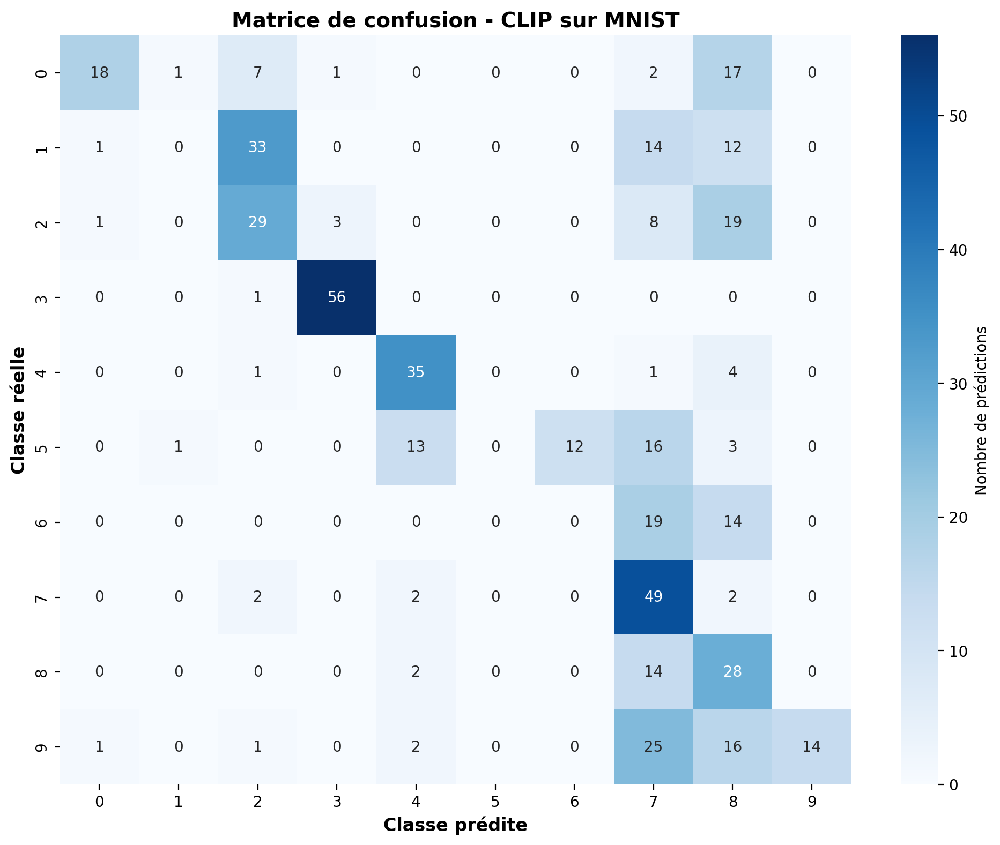


📈 RAPPORT DE CLASSIFICATION DÉTAILLÉ
              precision    recall  f1-score   support

     Digit 0      0.857     0.391     0.537        46
     Digit 1      0.000     0.000     0.000        60
     Digit 2      0.392     0.483     0.433        60
     Digit 3      0.933     0.982     0.957        57
     Digit 4      0.648     0.854     0.737        41
     Digit 5      0.000     0.000     0.000        45
     Digit 6      0.000     0.000     0.000        33
     Digit 7      0.331     0.891     0.483        55
     Digit 8      0.243     0.636     0.352        44
     Digit 9      1.000     0.237     0.384        59

    accuracy                          0.458       500
   macro avg      0.441     0.448     0.388       500
weighted avg      0.461     0.458     0.400       500



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [44]:
# Matrice de confusion
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Calculer la matrice de confusion
cm = confusion_matrix(true_labels_list, predictions_list)

print("\n📊 MATRICE DE CONFUSION")
print("=" * 80)

# Visualisation
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=range(10), yticklabels=range(10),
            cbar_kws={'label': 'Nombre de prédictions'})
ax.set_xlabel('Classe prédite', fontsize=12, fontweight='bold')
ax.set_ylabel('Classe réelle', fontsize=12, fontweight='bold')
ax.set_title('Matrice de confusion - CLIP sur MNIST', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Rapport de classification
print("\n📈 RAPPORT DE CLASSIFICATION DÉTAILLÉ")
print("=" * 80)
print(classification_report(true_labels_list, predictions_list,
                          target_names=[f'Digit {i}' for i in range(10)],
                          digits=3))

EXEMPLES DE PRÉDICTIONS


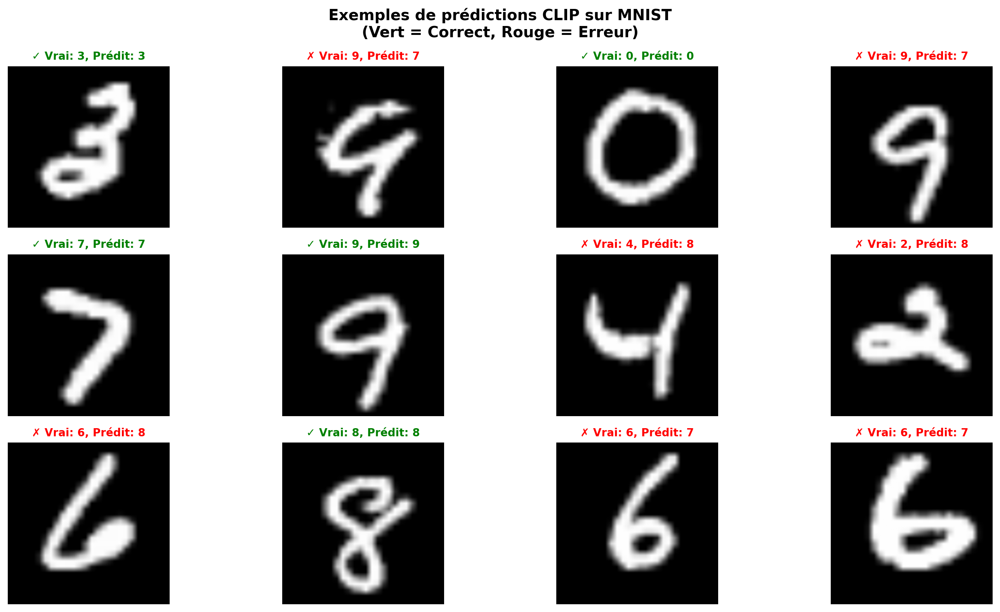

In [45]:
# Visualiser quelques exemples de prédictions
print("=" * 80)
print("EXEMPLES DE PRÉDICTIONS")
print("=" * 80)

# Prendre 12 exemples aléatoires
num_examples = 12
example_indices = random.sample(range(len(predictions_list)), num_examples)

fig = plt.figure(figsize=(15, 8))

for i, idx in enumerate(example_indices):
    # Récupérer l'image originale
    image, true_label = mnist_test[indices[idx]]

    # Enlever la normalisation pour l'affichage
    image_display = image[0].cpu().numpy()  # Prendre le premier canal (tous identiques)

    predicted_label = predictions_list[idx]
    is_correct = (predicted_label == true_label)

    plt.subplot(3, 4, i + 1)
    plt.imshow(image_display, cmap='gray')

    color = 'green' if is_correct else 'red'
    marker = '✓' if is_correct else '✗'

    plt.title(f"{marker} Vrai: {true_label}, Prédit: {predicted_label}",
             color=color, fontweight='bold', fontsize=10)
    plt.axis('off')

plt.suptitle('Exemples de prédictions CLIP sur MNIST\n(Vert = Correct, Rouge = Erreur)',
            fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

ANALYSE DES PERFORMANCES PAR CLASSE
Chiffre 0: 39.1% (18/46)
Chiffre 1: 0.0% (0/60)
Chiffre 2: 48.3% (29/60)
Chiffre 3: 98.2% (56/57)
Chiffre 4: 85.4% (35/41)
Chiffre 5: 0.0% (0/45)
Chiffre 6: 0.0% (0/33)
Chiffre 7: 89.1% (49/55)
Chiffre 8: 63.6% (28/44)
Chiffre 9: 23.7% (14/59)


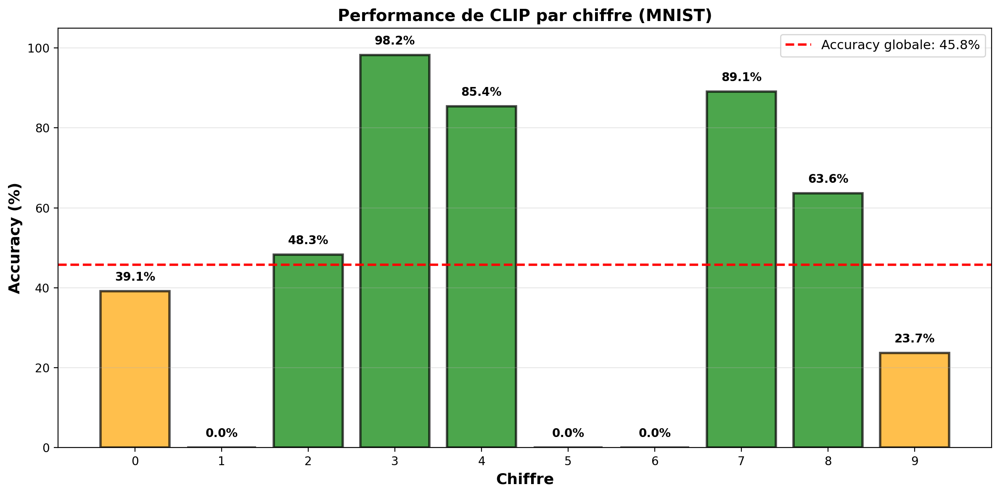


💡 CONCLUSIONS :
   - CLIP atteint 45.8% d'accuracy sur MNIST en zero-shot
   - Meilleure classe : Chiffre 3 (98.2%)
   - Pire classe : Chiffre 1 (0.0%)
   - CLIP peut classifier des chiffres manuscrits sans entraînement spécifique


In [46]:
# Analyse des performances par classe
print("=" * 80)
print("ANALYSE DES PERFORMANCES PAR CLASSE")
print("=" * 80)

# Calculer l'accuracy par classe
class_accuracies = []
for digit in range(10):
    # Indices où le vrai label est 'digit'
    class_indices = [i for i, label in enumerate(true_labels_list) if label == digit]
    if len(class_indices) > 0:
        correct_in_class = sum([predictions_list[i] == digit for i in class_indices])
        accuracy_class = (correct_in_class / len(class_indices)) * 100
        class_accuracies.append(accuracy_class)
        print(f"Chiffre {digit}: {accuracy_class:.1f}% ({correct_in_class}/{len(class_indices)})")
    else:
        class_accuracies.append(0)

# Visualisation
fig, ax = plt.subplots(figsize=(12, 6))

colors_acc = ['green' if acc > accuracy else 'orange' for acc in class_accuracies]
bars = ax.bar(range(10), class_accuracies, color=colors_acc, alpha=0.7, edgecolor='black', linewidth=2)

# Ligne moyenne
ax.axhline(y=accuracy, color='red', linestyle='--', linewidth=2,
          label=f'Accuracy globale: {accuracy:.1f}%')

ax.set_xlabel('Chiffre', fontsize=13, fontweight='bold')
ax.set_ylabel('Accuracy (%)', fontsize=13, fontweight='bold')
ax.set_title('Performance de CLIP par chiffre (MNIST)', fontsize=14, fontweight='bold')
ax.set_xticks(range(10))
ax.set_ylim([0, 105])
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)

# Ajouter les valeurs sur les barres
for bar, acc in zip(bars, class_accuracies):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{acc:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("\n" + "=" * 80)
print("💡 CONCLUSIONS :")
print(f"   - CLIP atteint {accuracy:.1f}% d'accuracy sur MNIST en zero-shot")
print(f"   - Meilleure classe : Chiffre {class_accuracies.index(max(class_accuracies))} ({max(class_accuracies):.1f}%)")
print(f"   - Pire classe : Chiffre {class_accuracies.index(min(class_accuracies))} ({min(class_accuracies):.1f}%)")
print("   - CLIP peut classifier des chiffres manuscrits sans entraînement spécifique")
print("=" * 80)